# Decision Tree and random Forest

## Decision Tree

Decision trees are a type of supervised machine learning algorithm that can be used for both classification and regression tasks. They are particularly useful due to their simplicity, interpretability, and versatility.

Here's a brief explanation of decision trees:

- **Structure**: A decision tree starts with a root node that signifies the whole population or sample, which then separates into two or more uniform groups via a method called splitting. When sub-nodes undergo further division, they are identified as decision nodes, while the ones that don't divide are called terminal nodes or leaves. A segment of a complete tree is referred to as a branch.

- **Training**: The root of a tree is (should be) the best predictor (feature). The tree is built from decision nodes (corresponding to features) and leaf nodes (corresponding to class labels).

- **Algorithms**: There are several algorithms used to build decision trees, including ID3 and C4.5 algorithms. These algorithms decide the best feature to split the data based on measures like information gain or information gain ratio.

- **Pruning**: To prevent overfitting, decision trees can be pruned, which involves removing branches that contribute little to the prediction


We are an example of how to create a decision tree in Python using the scikit-learn library.

In this example, we first load the Iris dataset and split it into a training set and a test set. Then, we create a decision tree classifier and train it on the training data. Finally, we visualize the decision tree using the `tree.plot_tree()` function from scikit-learn.

## Explanation of the Code

This script is designed to load the Iris dataset, convert it into a pandas DataFrame, and then create a pair plot using seaborn and matplotlib libraries.

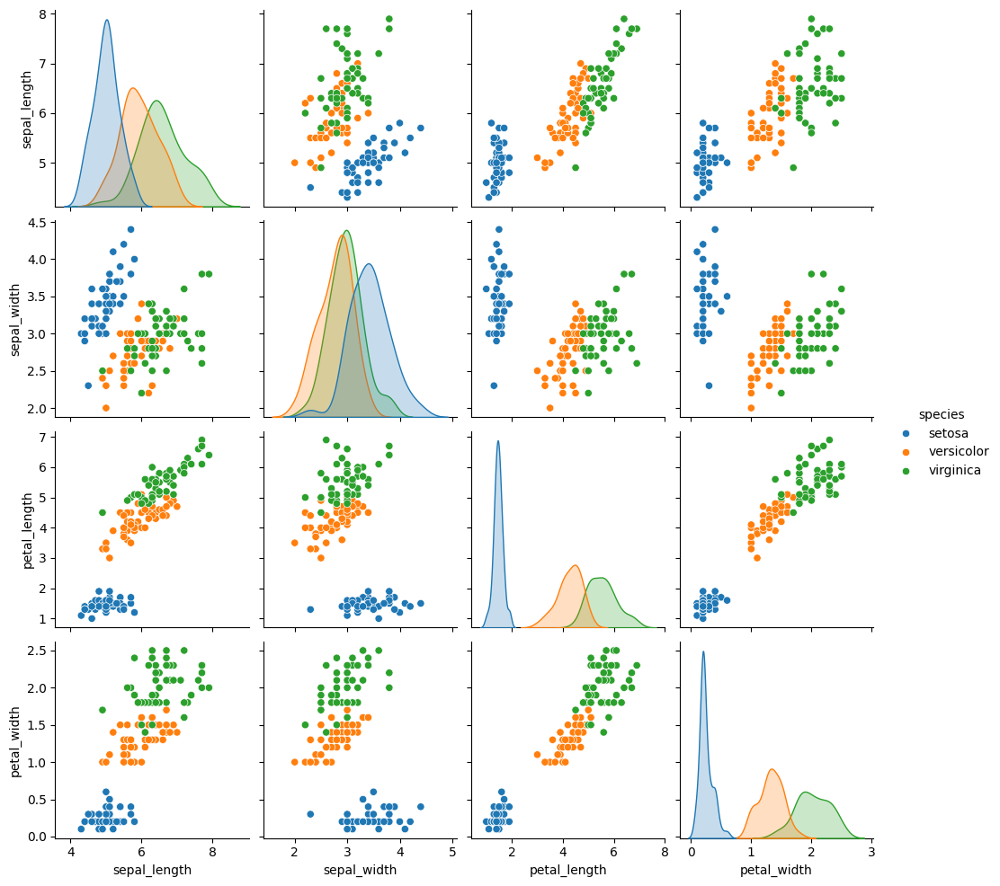

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris

# Load the Iris dataset
iris = load_iris()
df = sns.load_dataset("iris")

# Create a pair plot
sns.pairplot(df, hue="species")
plt.show()


These lines import the required libraries. `seaborn` and `matplotlib.pyplot` are used for creating plots, and `sklearn.datasets` contains the Iris dataset.

the Iris dataset is loaded twice - once using `sklearn.datasets.load_iris()` and once using `seaborn.load_dataset()`. The second method returns a pandas DataFrame, which is easier to manipulate and analyze.

Finally, a pair plot is created using seaborn's ``pairplot()`` function. This function creates a grid of Axes such that each variable in your data will be shared across the y-axes across a single row and the x-axes across a single column. The diagonal plots are treated differently: a univariate distribution plot is drawn to show the marginal distribution of the data in each column.

The `hue` parameter is set to "species", which means the points are colored according to the species they belong to. The `plt.show()` function displays the plot.

---

This script loads the Iris dataset from the `sklearn.datasets` module, converts it into a pandas DataFrame, and then adds the target values to the DataFrame.

In [56]:
import pandas as pd
from sklearn import datasets

iris = datasets.load_iris()

df = pd.DataFrame(iris.data, columns=iris.feature_names)
df['target'] = iris.target

df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


Here, the Iris dataset is loaded using `sklearn.datasets.load_iris()`. This function returns a dictionary-like object, with the actual `data` stored in the data field and the corresponding labels in the `target` field.
the data part of the Iris dataset is converted into a pandas DataFrame. The `pd.DataFrame()` function takes two arguments: the data and the column names. The data is obtained from `iris.data`, and the column names are obtained from `iris.feature_names`. Each feature of the Iris dataset corresponds to a column in the DataFrame.
Then, the target values are added to the DataFrame under the column name 'target'. The target values represent the class (or species) of each instance in the Iris dataset. They are stored in `iris.target`.

Finally, the DataFrame `df` is displayed. You can view the first few rows of the DataFrame by simply typing `df` in your Jupyter notebook.

---


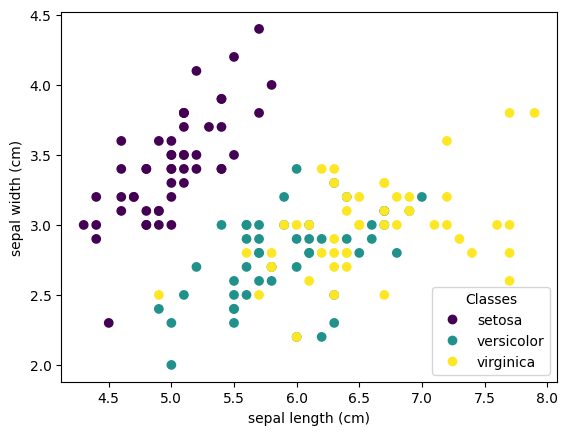

In [57]:
import matplotlib.pyplot as plt

_, ax = plt.subplots()
scatter = ax.scatter(iris.data[:, 0], iris.data[:, 1], c=iris.target)
ax.set(xlabel=iris.feature_names[0], ylabel=iris.feature_names[1])
_ = ax.legend(
    scatter.legend_elements()[0], iris.target_names, loc="lower right", title="Classes"
)

This script creates a scatter plot of the Iris dataset using matplotlib, with different colors representing different classes.
First, the `matplotlib.pyplot` library is imported. Then, a new figure and axes are created using `plt.subplots()`. The underscore `_` is a convention used to ignore the return value of `plt.subplots()`, which is the figure object. We only need the axes object (`ax`), which is returned as the second element of the tuple
Next, a scatter plot is created on the axes. The x and y coordinates of the points are taken from the first and second features of the Iris dataset (`iris.data[:, 0]` and `iris.data[:, 1]`), and the color of the points is determined by the target values (`iris.target`). The `scatter()` function returns a PathCollection object, which is stored in the variable `scatter`.
Then, the labels for the x and y axes are set to the names of the first and second features of the Iris dataset.
Finally, a legend is added to the plot. The `legend_elements()` method of the PathCollection object is called to get the handles (the small colored squares that represent the classes in the legend) and labels (the names of the classes). These are passed to the `ax.legend()` function along with the location of the legend ("lower right") and its title ("Classes"). The underscore `_` is again used to ignore the return value of `ax.legend()`.

---



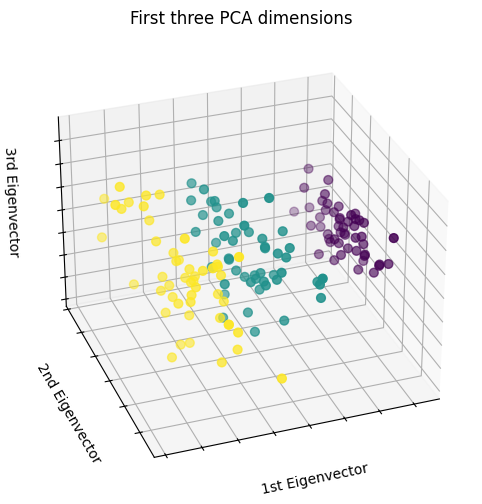

In [58]:
# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn.decomposition import PCA

fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)

X_reduced = PCA(n_components=3).fit_transform(iris.data)
ax.scatter(
    X_reduced[:, 0],
    X_reduced[:, 1],
    X_reduced[:, 2],
    c=iris.target,
    s=40,
)

ax.set_title("First three PCA dimensions")
ax.set_xlabel("1st Eigenvector")
ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd Eigenvector")
ax.yaxis.set_ticklabels([])
ax.set_zlabel("3rd Eigenvector")
ax.zaxis.set_ticklabels([])

plt.show()

This script performs Principal Component Analysis (PCA) on the Iris dataset and creates a 3D scatter plot of the results.
First, the `mpl_toolkits.mplot3d` library is imported, which is required for doing 3D projections with matplotlib. Then, the `PCA` class from the `sklearn.decomposition` module is imported. PCA is a technique used to emphasize variation and bring out strong patterns in a dataset.
Next, a new figure is created with `plt.figure()`, and a 3D subplot is added to this figure with `fig.add_subplot()`. The parameters `elev` and `azim` control the elevation and azimuth angles of the viewpoint.
Then, PCA is performed on the Iris dataset. The `PCA(n_components=3)` creates a PCA object that will reduce the data to three dimensions. The `fit_transform()` method fits the PCA model to the data and applies the dimensionality reduction. The reduced data is stored in `X_reduced`.
A 3D scatter plot is created on the axes. The x, y, and z coordinates of the points are taken from the first, second, and third dimensions of the reduced data (`X_reduced[:, 0]`, `X_reduced[:, 1]`, and `X_reduced[:, 2]`), and the color of the points is determined by the target values (`iris.target`). The size of the points is set to 40.

The title of the plot and the labels of the x, y, and z axes are set. The `set_ticklabels([])` calls remove the tick labels from the axes.

Finally, the plot is displayed with `plt.show()`.


---



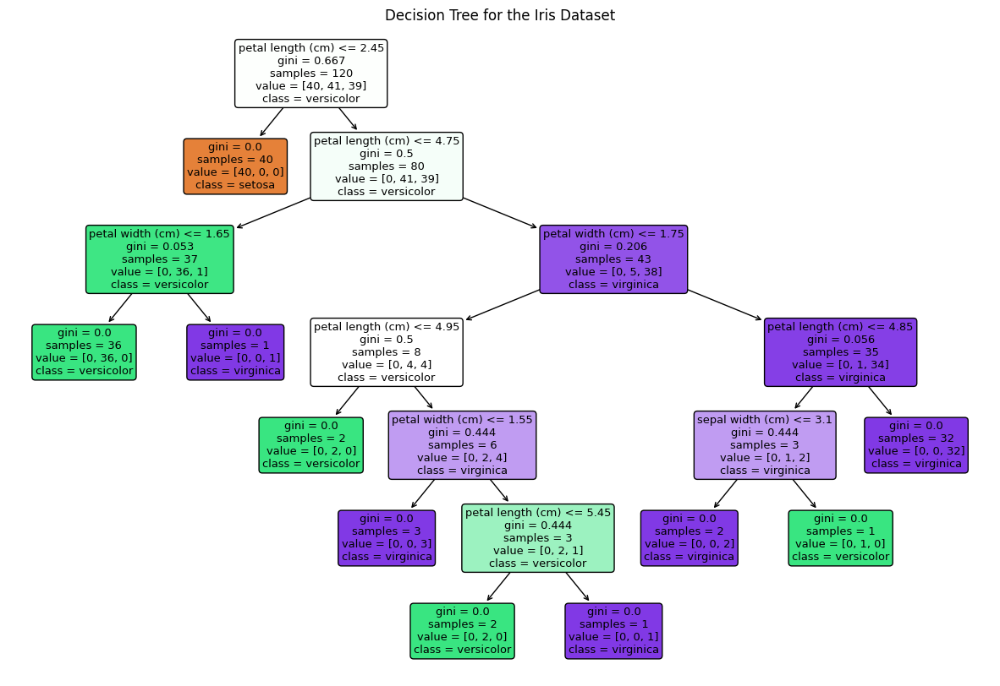

In [59]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import tree

# Load the Iris dataset
iris = load_iris()
X = iris.data
y = iris.target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the Decision Tree on the training data
dt_classifier.fit(X_train, y_train)

# Visualize the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_classifier, filled=True, feature_names=iris.feature_names, class_names=iris.target_names, rounded=True)
plt.title('Decision Tree for the Iris Dataset')
plt.show()


This script trains a Decision Tree Classifier on the Iris dataset and visualizes the resulting decision tree.

First, the necessary libraries are imported. These include `matplotlib.pyplot ` for plotting, `sklearn.datasets` for loading the Iris dataset, `sklearn.model_selection` for splitting the dataset into training and testing sets, `sklearn.tree` for creating and visualizing the Decision Tree, and `sklearn` for general sklearn functionality.

The Iris dataset is loaded and the data and target arrays are extracted.

The data is split into training and testing sets using `train_test_split()`. 80% of the data is used for training and 20% is used for testing. The `random_state` parameter ensures that the splits generate are reproducible.

A Decision Tree Classifier is created. The `random_state` parameter ensures that the splits generated during the fitting of the decision tree are reproducible.

The Decision Tree Classifier is trained on the training data using the `fit() `method.

Finally, the trained decision tree is visualized using `plot_tree()`. The `filled=True` argument fills the nodes of the tree to indicate the majority class. The `feature_names` and `class_names` arguments are used to label the features and classes, respectively. The `rounded=True` argument rounds the corners of the boxes in the plot. The plot is displayed with a title and shown using `plt.show()`.

---


In [60]:
from sklearn.metrics import r2_score, mean_squared_error

# Make predictions on the test data
y_pred = dt_classifier.predict(X_test)

# Calculate R² score
r2 = r2_score(y_test, y_pred)
print("R² Score: ", r2)

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error: ", mse)


R² Score:  1.0
Mean Squared Error:  0.0


This script uses the trained Decision Tree Classifier to make predictions on the test data and calculates the R² score and Mean Squared Error of these predictions.

The `r2_score` and `mean_squared_error` functions from `sklearn.metrics` are imported. These functions are used to calculate the R² score and Mean Squared Error, respectively.

Predictions are made on the test data using the `predict()` method of the Decision Tree Classifier. The predicted targets are stored in `y_pred`.

The R² score of the predictions is calculated using the `r2_score()` function. The R² score is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model. In other words, it measures how well the model predicts the actual outcomes.

The Mean Squared Error of the predictions is calculated using the `mean_squared_error()` function. The Mean Squared Error is a risk metric corresponding to the expected value of the squared (quadratic) error or loss. It is also known as the average squared difference between prediction and actual observation. The lower the MSE, the better the fit of the model.

---


## Random Forest

Random Forest is a supervised learning algorithm that produces a great result most of the time. It is a flexible, easy-to-use machine learning algorithm that can be used for both classification and regression tasks.

Here's a brief explanation of Random Forest:

- **Structure**: Random Forest is essentially an ensemble of decision trees. It builds multiple decision trees and merges them together to get a more accurate and stable prediction. Each decision tree in the forest considers a random subset of features when forming questions and only has access to a random set of the training data points. This increases diversity in the forest leading to more robust overall predictions.

- **Working**: Random Forest works by producing multiple decision trees, randomly choosing features to make decisions when splitting nodes to create each tree. It then takes these randomized observations from each tree and averages them out to build a final model. When it comes time to make a prediction, the random forest takes an average of all the individual decision tree estimates.

- **Advantages**: Random Forest has several advantages. It is easy to use and produces good prediction results even without hyper-parameter tuning. It helps to avoid overfitting, especially when there are enough trees in the forest. It also provides a pretty good indicator of the importance it assigns to your features.

- **Disadvantages**: One of the main limitations of Random Forest is that a large number of trees can make the algorithm too slow and ineffective for real-time predictions. Also, Random Forest is a predictive modeling tool and not a descriptive tool, meaning if you’re looking for a description of the relationships in your data, other approaches would be better.

Here's an example of how to create a Random Forest in Python using the scikit-learn library:




In this example, we first load the Iris dataset and split it into a training set and a test set. Then, we create a Random Forest classifier and train it on the training data. Finally, we use the trained classifier to predict the results for the test set.

### Exmple

This script trains a Random Forest Classifier on the Iris dataset, visualizes individual decision trees in the Random Forest, and plots the feature importances.

First, the necessary libraries are imported. These include `numpy` for numerical computations, `matplotlib.pyplot` for plotting, `sklearn.datasets` for loading the Iris dataset, `sklearn.model_selection` for splitting the dataset into training and testing sets, `sklearn.ensemble` for creating the Random Forest, and `sklearn.tree` for visualizing the decision trees.

The Iris dataset is loaded and the data and target arrays are extracted.

The data is split into training and testing sets using `train_test_split()`. 80% of the data is used for training and 20% is used for testing. The `random_state` parameter ensures that the splits generate are reproducible.

A Random Forest Classifier is created with 100 estimators (decision trees). The `random_state` parameter ensures that the splits generated during the fitting of the decision trees are reproducible.

The Random Forest Classifier is trained on the training data using the `fit()` method.

Each decision tree in the Random Forest is visualized using `plot_tree()`. The `filled=True` argument fills the nodes of the tree to indicate the majority class. The `feature_names` and `class_names` arguments are used to label the features and classes, respectively. The `rounded=True` argument rounds the corners of the boxes in the plot. The plot is displayed with a title and shown using `plt.show()`.

Finally, the feature importances of the Random Forest are plotted. The feature importances indicate the relative importance of each feature in making predictions. The `np.argsort()` function is used to sort the indices of the feature importances in descending order. This means that the most important feature will be plotted first. The bar plot is displayed with a title and shown using `plt.show()`.



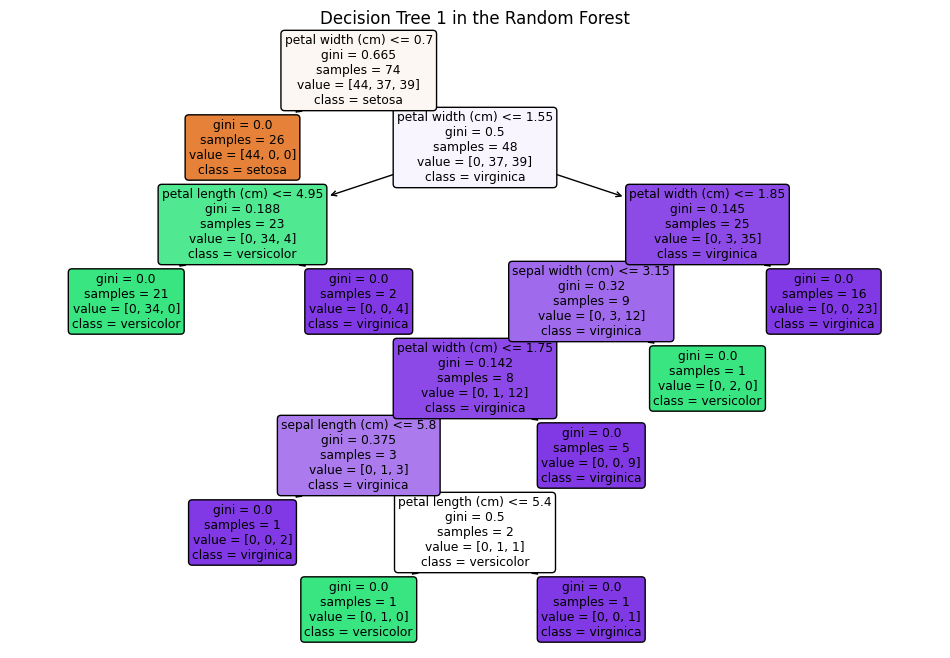

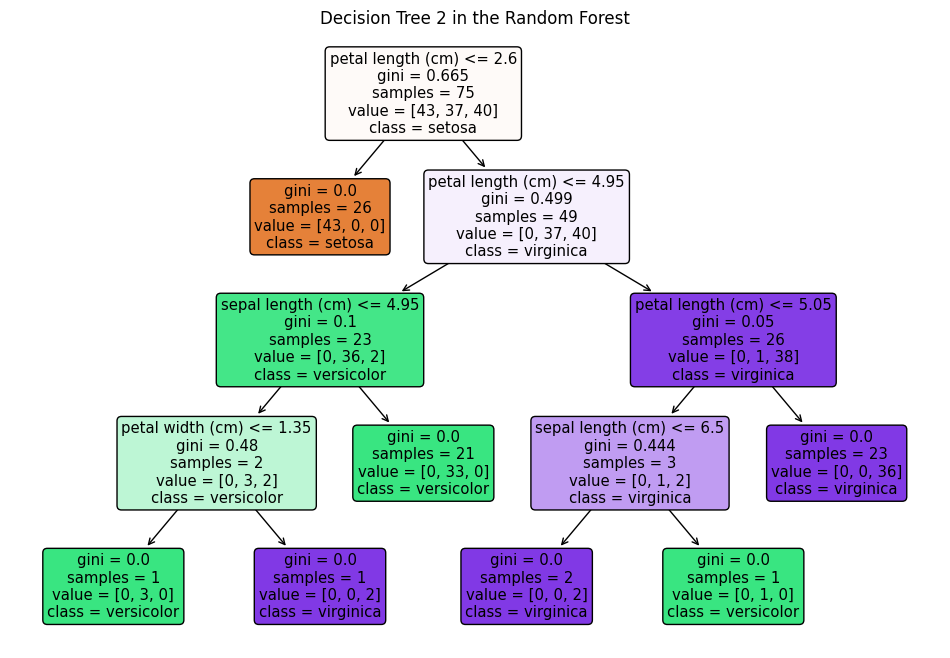

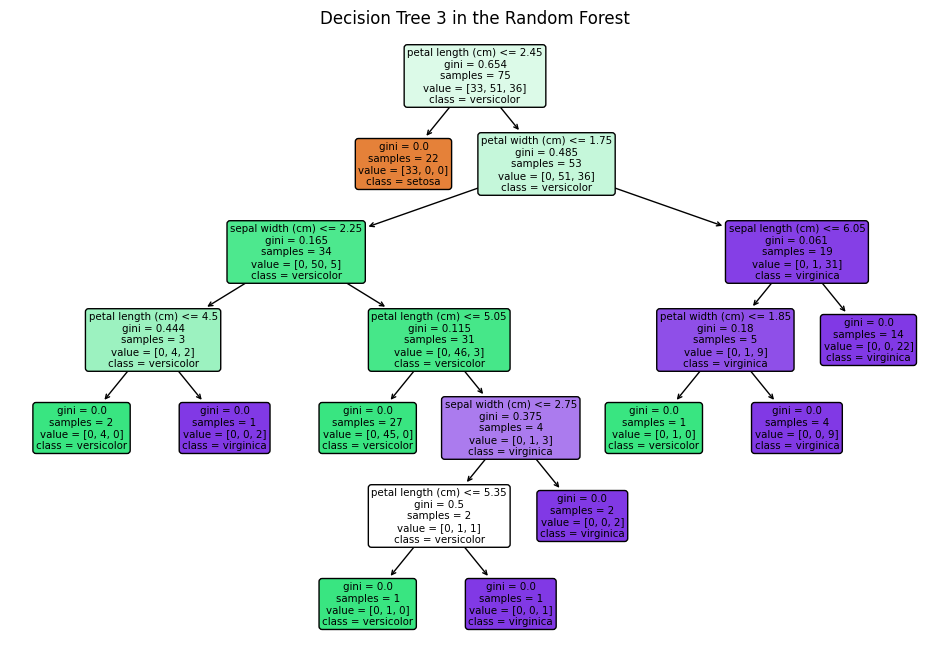

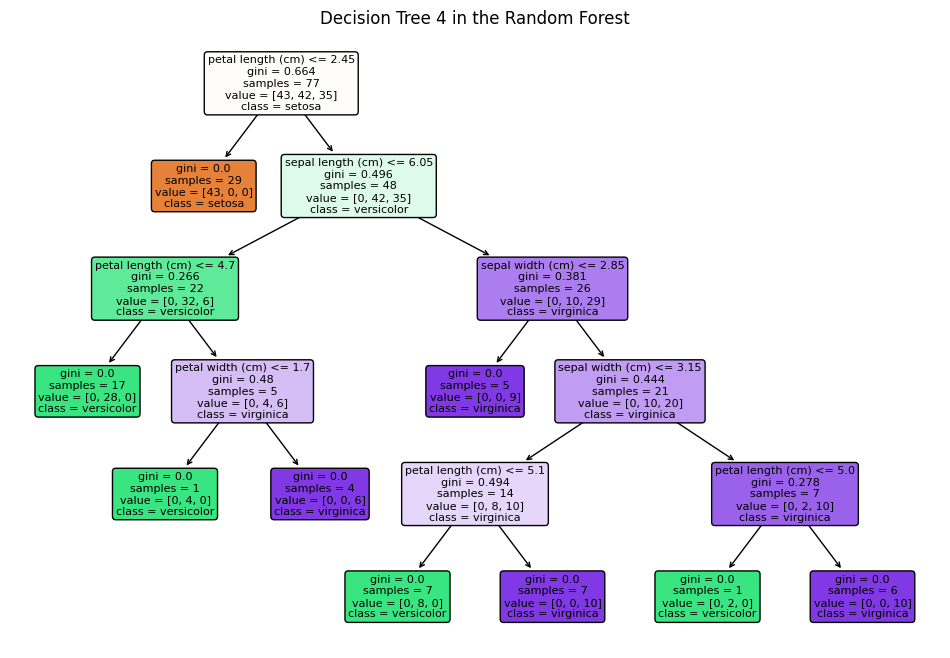

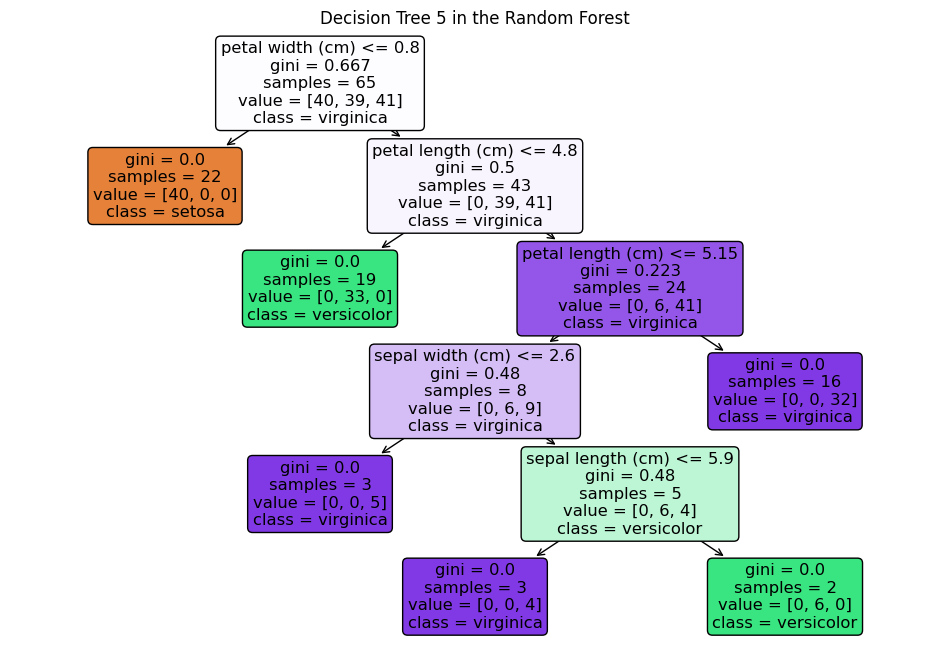

...

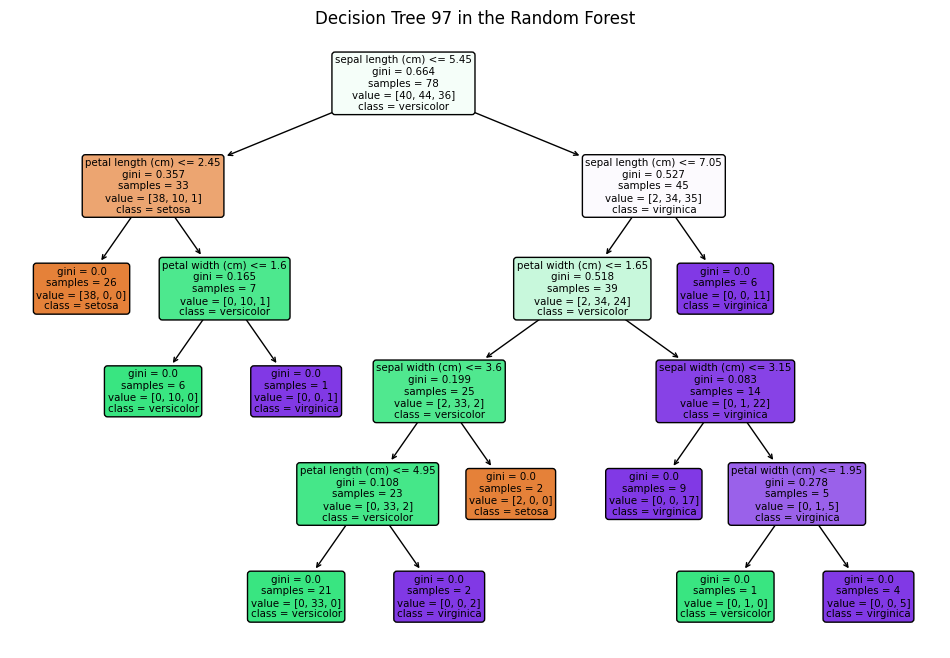

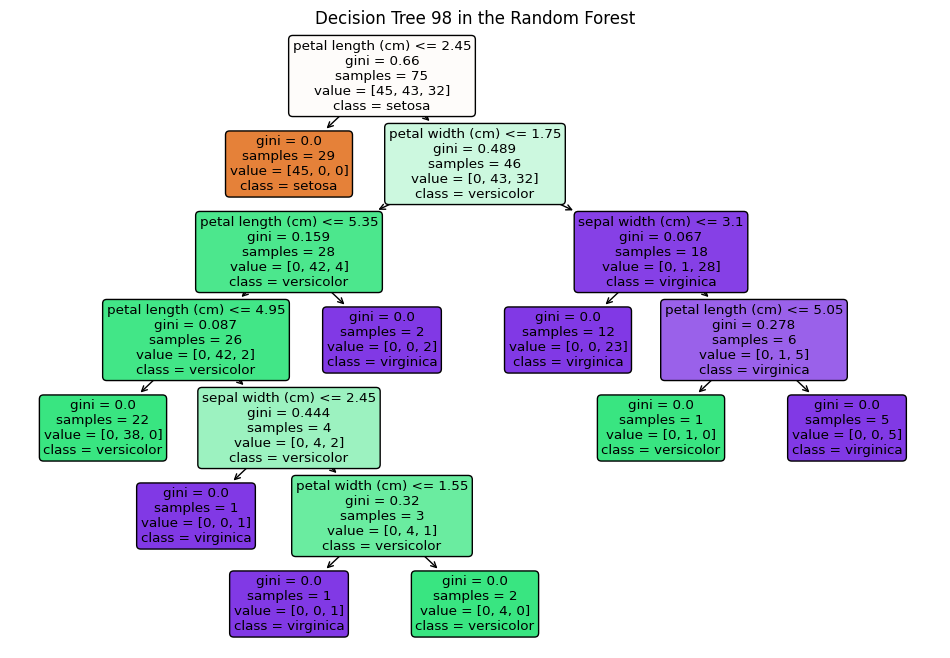

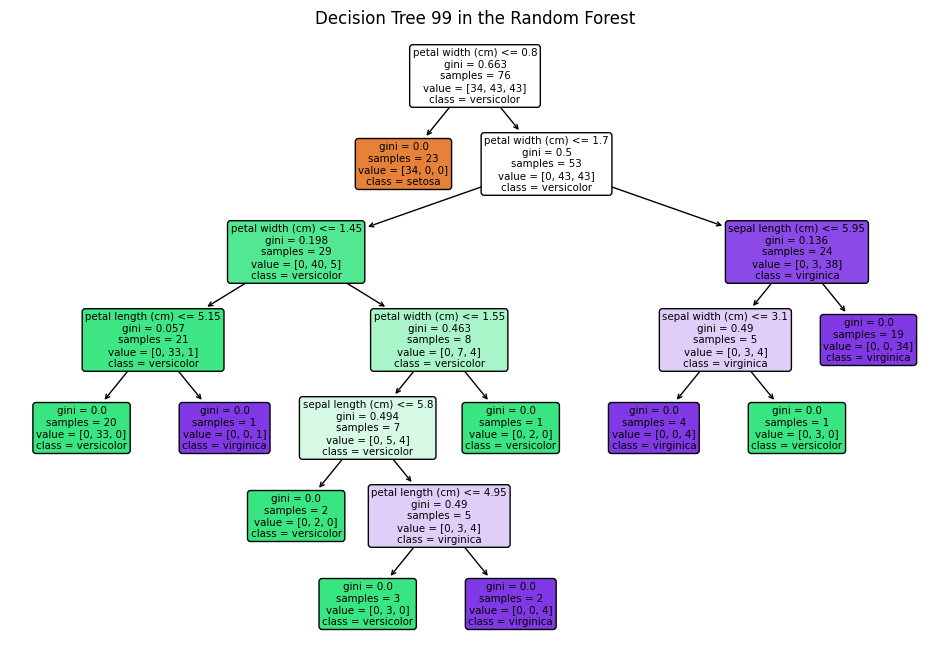

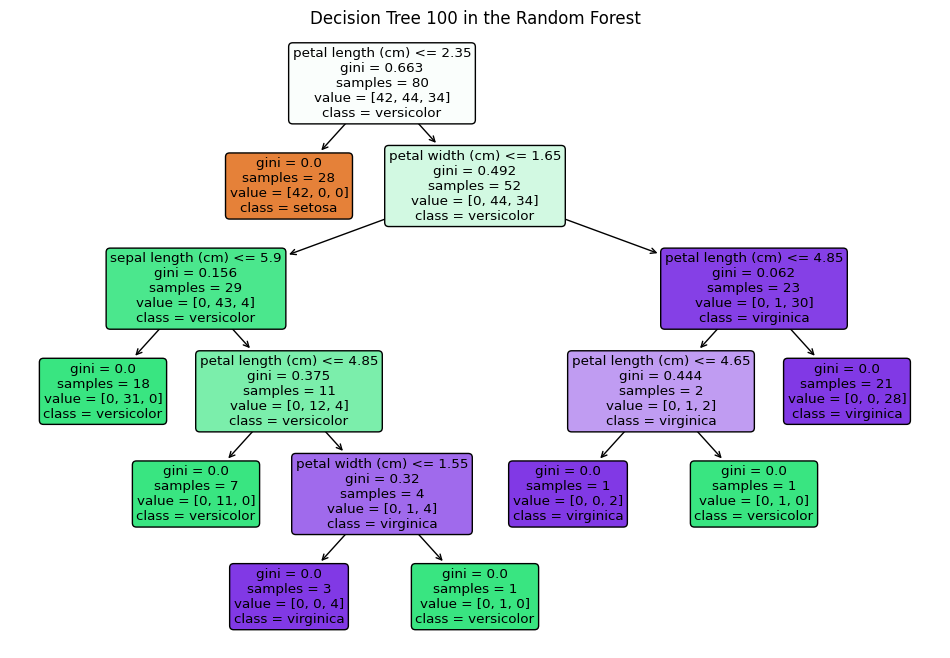

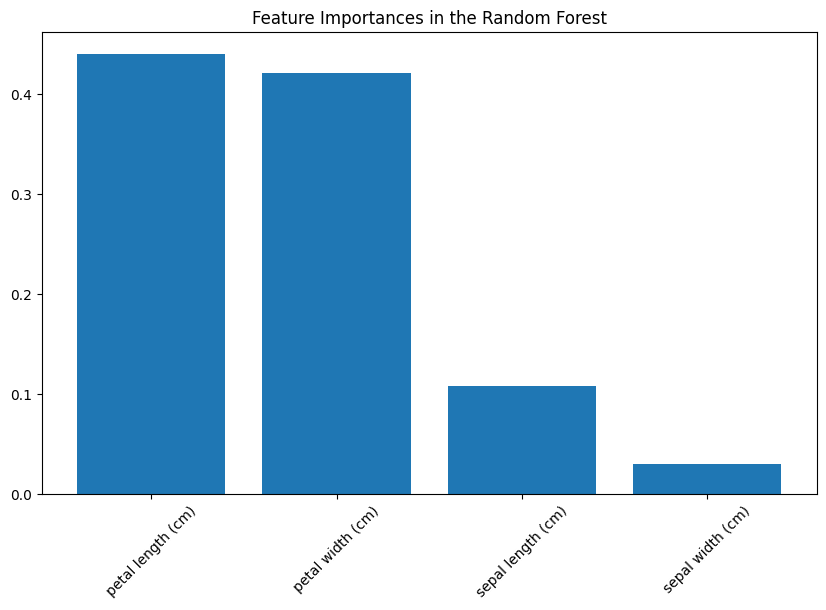

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree

# Load the Iris dataset
iris = load_iris()
X = iris.data
y = iris.target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the Random Forest on the training data
rf_classifier.fit(X_train, y_train)

# Visualize individual decision trees in the Random Forest
n_trees = len(rf_classifier.estimators_)

# Plot each tree
for i in range(n_trees):
    plt.figure(figsize=(12, 8))
    plot_tree(rf_classifier.estimators_[i], filled=True, feature_names=iris.feature_names, class_names=iris.target_names, rounded=True)
    plt.title(f'Decision Tree {i+1} in the Random Forest')
    plt.show()

# Optionally, you can also plot the feature importances
feature_importances = rf_classifier.feature_importances_
indices = np.argsort(feature_importances)[::-1]

plt.figure(figsize=(10, 6))
plt.bar(range(X_train.shape[1]), feature_importances[indices])
plt.xticks(range(X_train.shape[1]), np.array(iris.feature_names)[indices], rotation=45)
plt.title('Feature Importances in the Random Forest')
plt.show()


In [62]:
from sklearn.metrics import classification_report, confusion_matrix

# Make predictions on the test data
y_pred = rf_classifier.predict(X_test)

# Print confusion matrix
print(confusion_matrix(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))


[[10  0  0]
 [ 0  9  0]
 [ 0  0 11]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00        11

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



In [63]:
# Print feature importance
for feature, importance in zip(iris.feature_names, rf_classifier.feature_importances_):
   print(f"{feature}: {importance}")


sepal length (cm): 0.10809762464246378
sepal width (cm): 0.030386812473242528
petal length (cm): 0.43999397414456937
petal width (cm): 0.4215215887397244



1. **Importing Metrics**: The first line imports the `classification_report` and `confusion_matrix` functions from `sklearn.metrics`. These functions are used to evaluate the performance of the model.

2. **Making Predictions**: The `rf_classifier.predict(X_test)` line makes predictions on the test data. `rf_classifier` is assumed to be a trained Random Forest classifier.

3. **Printing Confusion Matrix**: The `confusion_matrix(y_test, y_pred)` function computes the confusion matrix of the true versus the predicted binary classifications. This matrix is a table layout that allows visualization of the performance of an algorithm. Each row represents the instances in a predicted class, while each column represents the instances in an actual class.

4. **Printing Classification Report**: The `classification_report(y_test, y_pred)` function builds a text report showing the main classification metrics. It includes precision, recall, f1-score, and support scores for each class.

5. **Printing Feature Importance**: The final loop iterates over the feature names and corresponding importance values, printing each feature and its importance. This gives us an idea of how much each feature contributes to the model's predictions.